In [3]:
import numpy as np
import pandas as pd

df = pd.read_csv("employees.csv", sep=",", header=0)
df.shape

(1000, 8)

In [4]:
import pandas as pd

df = pd.read_csv("employees.csv")

numar_angajati = df.dropna().shape[0]

print("Numărul de angajați fără celule goale:", numar_angajati)


Numărul de angajați fără celule goale: 764


In [5]:
import pandas as pd

df = pd.read_csv('employees.csv')

numar_coloane = df.shape[1]

print("Numărul de coloane:", numar_coloane)

tipuri_coloane = df.dtypes

print("Tipurile coloanelor:")
print(tipuri_coloane)


Numărul de coloane: 8
Tipurile coloanelor:
First Name            object
Gender                object
Start Date            object
Last Login Time       object
Salary                 int64
Bonus %              float64
Senior Management     object
Team                  object
dtype: object


In [9]:
import pandas as pd

df = pd.read_csv('employees.csv')

for coloana in df.columns:
    tip_date = df[coloana].dtype
    if tip_date in ['int64', 'float64']:
        valoare_minima = df[coloana].min()
        valoare_maxima = df[coloana].max()
        valoare_medie = df[coloana].mean()
        print(f"Coloana '{coloana}': Minim: {valoare_minima}, Maxim: {valoare_maxima}, Medie: {valoare_medie}")
    else:
        print(f"Coloana '{coloana}' nu este de tip numeric")




Coloana 'First Name' nu este de tip numeric
Coloana 'Gender' nu este de tip numeric
Coloana 'Start Date' nu este de tip numeric
Coloana 'Last Login Time' nu este de tip numeric
Coloana 'Salary': Minim: 35013, Maxim: 149908, Medie: 90662.181
Coloana 'Bonus %': Minim: 1.015, Maxim: 19.944, Medie: 10.207555000000001
Coloana 'Senior Management' nu este de tip numeric
Coloana 'Team' nu este de tip numeric


In [11]:
import pandas as pd

df = pd.read_csv('employees.csv')
df = df.dropna()
for coloana in df.columns:
    tip_date = df[coloana].dtype
    if tip_date == 'object':
        numar_valori_unice = df[coloana].nunique()
        print(f"Coloana '{coloana}' are {numar_valori_unice} valori unice.")
    else:
        print(f"Coloana '{coloana}' este de tip numeric.")



Coloana 'First Name' are 199 valori unice.
Coloana 'Gender' are 2 valori unice.
Coloana 'Start Date' are 748 valori unice.
Coloana 'Last Login Time' are 604 valori unice.
Coloana 'Salary' este de tip numeric.
Coloana 'Bonus %' este de tip numeric.
Coloana 'Senior Management' are 2 valori unice.
Coloana 'Team' are 10 valori unice.


In [2]:
import pandas as pd

df = pd.read_csv('employees.csv')

df = df.fillna(method='ffill').fillna(method='bfill')

df.to_csv('nume_fisier_complet.csv', index=False)

print(df)


    First Name  Gender  Start Date Last Login Time  Salary  Bonus %  \
0      Douglas    Male    8/6/1993        12:42 PM   97308    6.945   
1       Thomas    Male   3/31/1996         6:53 AM   61933    4.170   
2        Maria  Female   4/23/1993        11:17 AM  130590   11.858   
3        Jerry    Male    3/4/2005         1:00 PM  138705    9.340   
4        Larry    Male   1/24/1998         4:47 PM  101004    1.389   
..         ...     ...         ...             ...     ...      ...   
995      Henry    Male  11/23/2014         6:09 AM  132483   16.655   
996    Phillip    Male   1/31/1984         6:30 AM   42392   19.675   
997    Russell    Male   5/20/2013        12:39 PM   96914    1.421   
998      Larry    Male   4/20/2013         4:45 PM   60500   11.985   
999     Albert    Male   5/15/2012         6:24 PM  129949   10.169   

     Senior Management                  Team  
0                 True             Marketing  
1                 True             Marketing  
2     

/tmp/ipykernel_25265/3135073769.py:5: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='ffill').fillna(method='bfill')
/tmp/ipykernel_25265/3135073769.py:5: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.fillna(method='ffill').fillna(method='bfill')


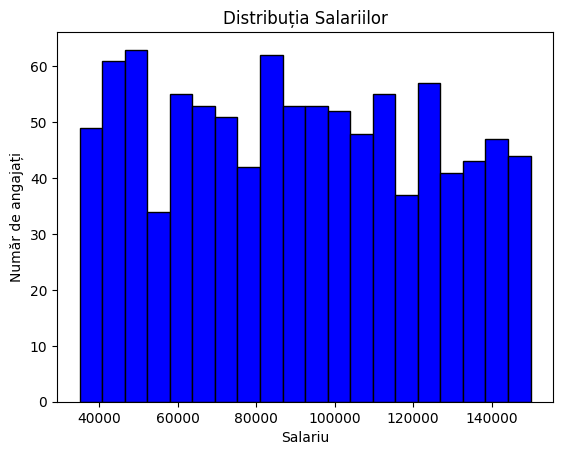

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('employees.csv')

salarii = df['Salary']

plt.hist(salarii, bins=20, color='blue', edgecolor='black')

plt.title('Distribuția Salariilor')
plt.xlabel('Salariu')
plt.ylabel('Număr de angajați')

plt.show()


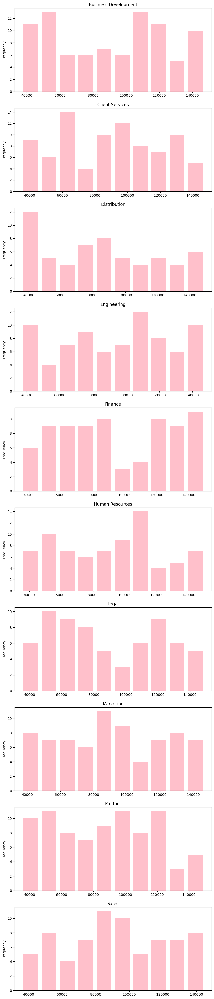

In [19]:
import matplotlib.pyplot as plt
import pandas as pd

df = pd.read_csv('employees.csv')
df_filtered = df.dropna()

groups= df_filtered[['Salary','Team']].groupby('Team')

noOfGroups= len(groups) 

figure, axes = plt.subplots(noOfGroups, 1, figsize=(10,50))

for i,(team, group) in enumerate(groups):
    group['Salary'].plot(kind='hist', ax=axes[i], color='pink',rwidth=0.8)
    axes[i].set_title(team)

plt.show()

In [8]:
import pandas as pd

df = pd.read_csv('employees.csv')

q_low = df['Salary'].quantile(0.01)
q_high = df['Salary'].quantile(0.99)

outliers_low = df[df['Salary'] < q_low]
outliers_high = df[df['Salary'] > q_high]

print("Angajații cu cele mai mici salarii:")
print(outliers_low)

print("\nAngajații cu cele mai mari salarii:")
print(outliers_high)


Angajații cu cele mai mici salarii:
    First Name  Gender  Start Date Last Login Time  Salary  Bonus %  \
63     Matthew    Male    1/2/2013        10:33 PM   35203   18.040   
82      Steven    Male   3/30/1980         9:20 PM   35095    8.379   
238      Kevin    Male   3/25/1982         7:31 AM   35061    5.128   
530   Kathleen  Female   6/13/2014         9:16 AM   35575   14.595   
576    Michael    Male   7/30/1993         5:35 PM   35013   14.879   
650    Cynthia  Female    7/5/1986         1:24 AM   35381   11.749   
762      Terry    Male  11/10/2004         4:33 AM   35633    3.947   
900  Christina  Female   6/23/2002         3:18 PM   35477   18.178   
906    Frances  Female   5/16/2014         8:31 AM   35884   17.667   
964      Bruce    Male    5/7/1980         8:00 PM   35802   12.391   

    Senior Management             Team  
63              False  Human Resources  
82               True  Client Services  
238             False            Legal  
530             Fa

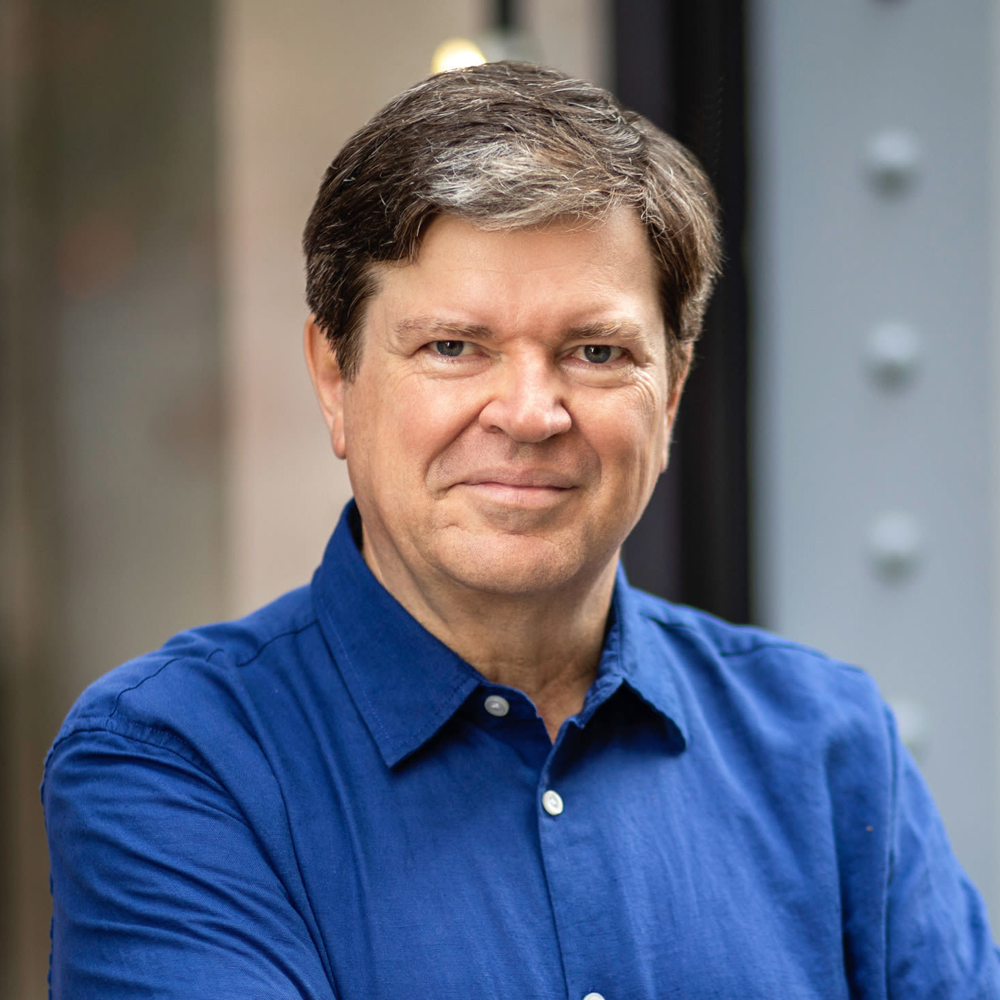

In [2]:
from PIL import Image
import glob, os

with Image.open("images/LeCun.jpg") as im:
    im.show()

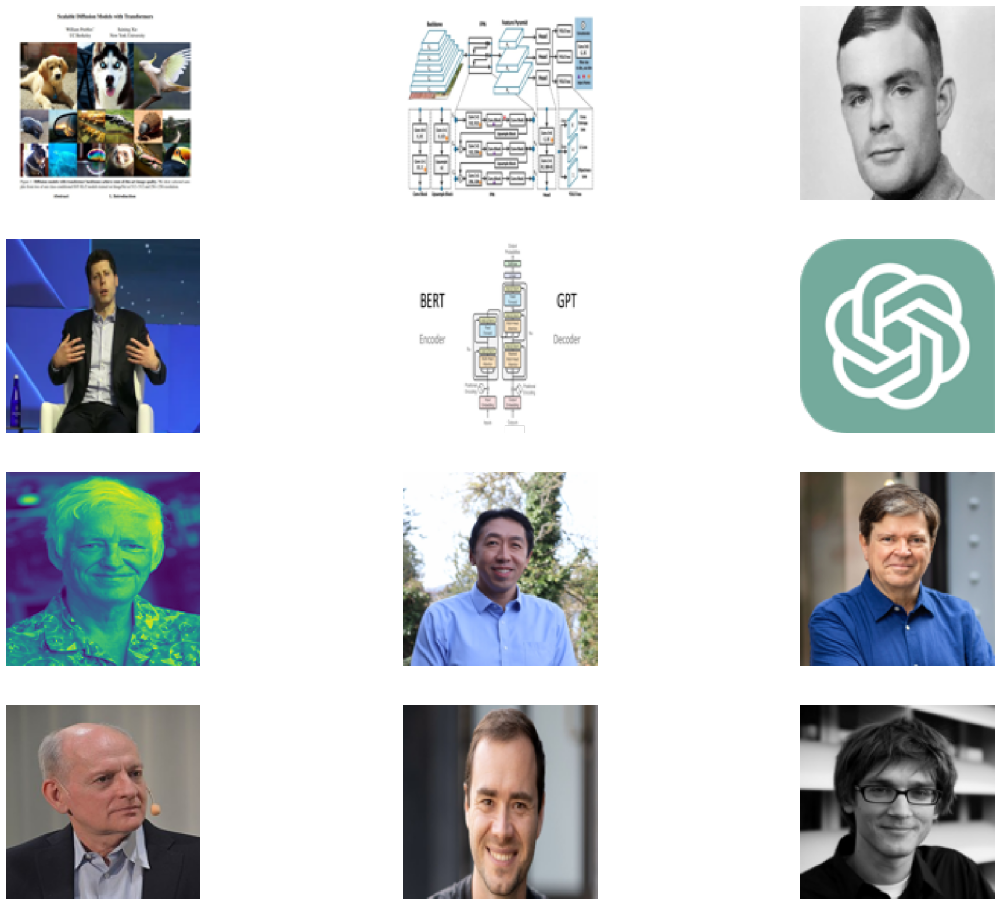

In [4]:
import glob
import matplotlib.pyplot as plt
from PIL import Image

size = 128, 128

imgs = []

fig, axes = plt.subplots(4, 3, figsize=(25,20))

i,j = 0, 0

for infile in glob.glob("images/*"):
    if infile.endswith(".png") or infile.endswith(".jpg") or infile.endswith(".webp"):
        with Image.open(infile) as im:
            im_resized = im.resize(size)
            axes[i][j].imshow(im_resized)
            axes[i][j].axis('off')
            j += 1
            if j == 3:
                i, j = i+1, 0

plt.show()

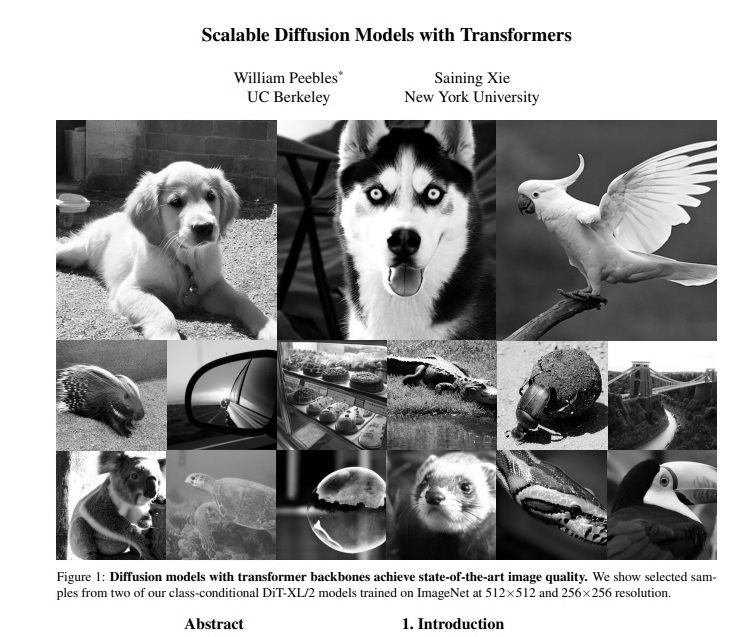

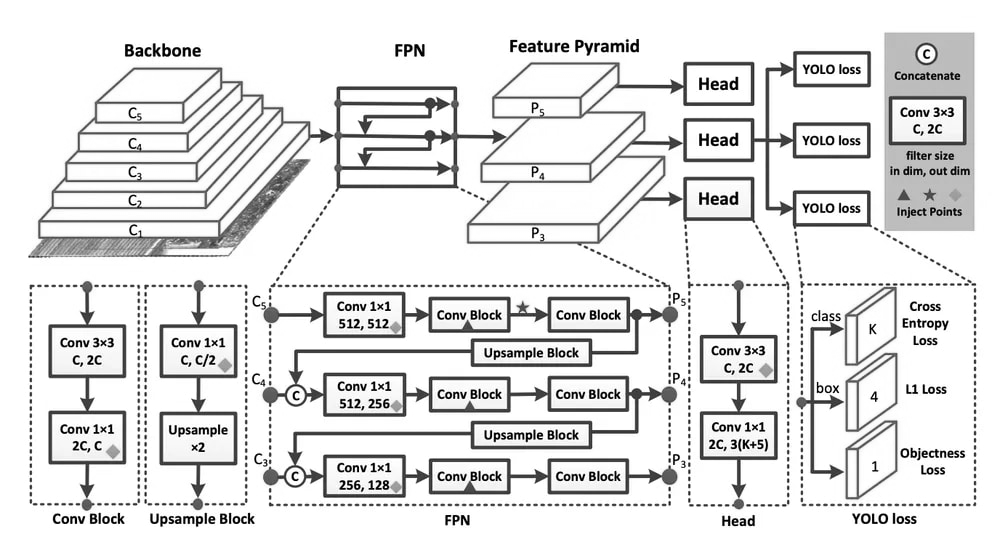

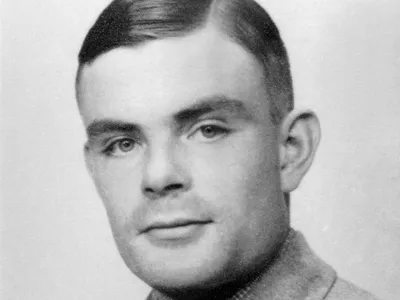

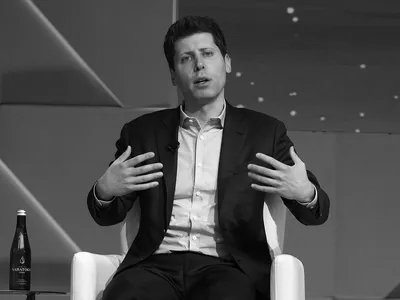

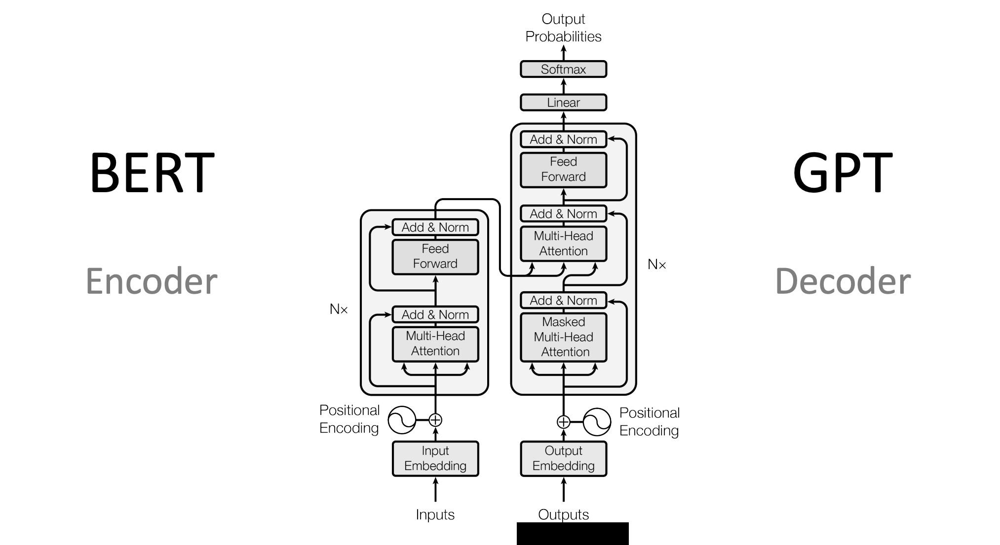

...

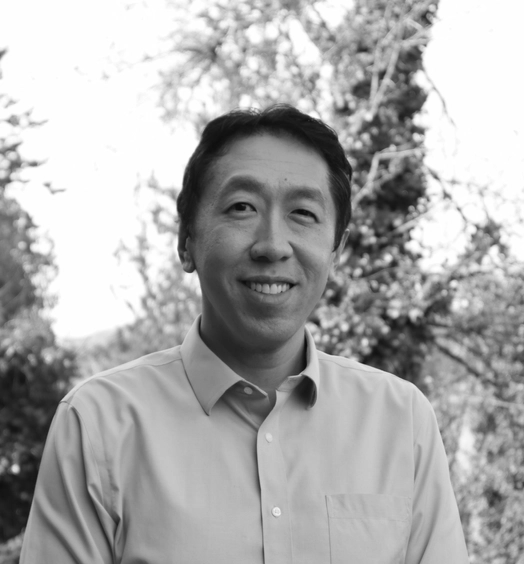

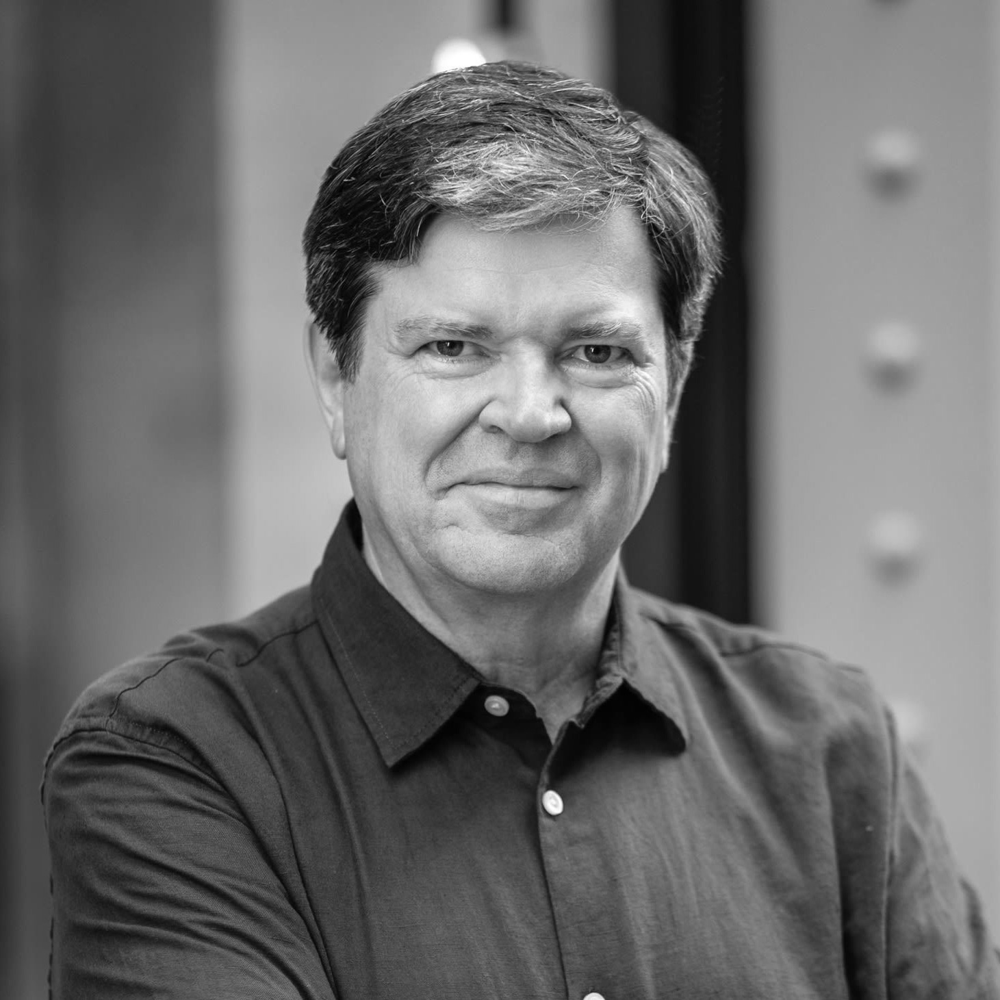

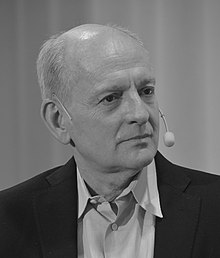

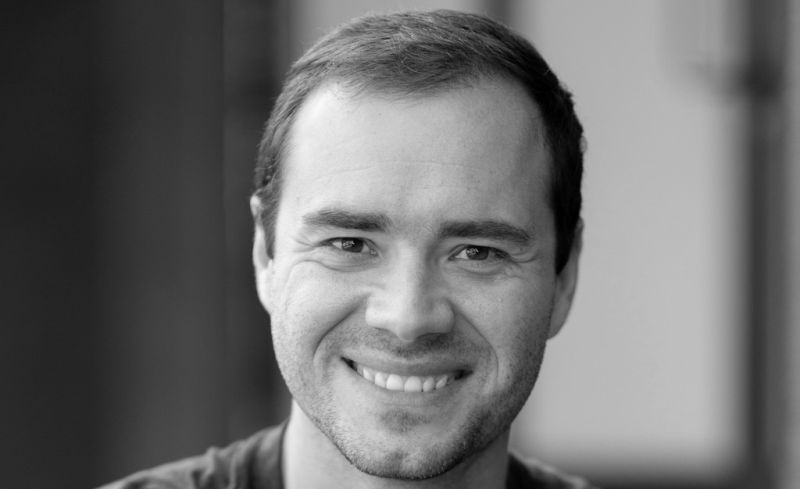

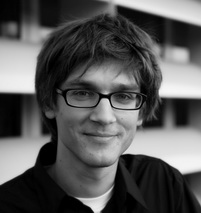

In [6]:
from PIL import ImageOps

for infile in glob.glob("images/*"):
    if infile.endswith(".png") or infile.endswith(".jpg") or infile.endswith(".webp"):
        file, ext = os.path.splitext(infile)
        with Image.open(infile) as im:
            gray_im = ImageOps.grayscale(im)
            gray_im.show()

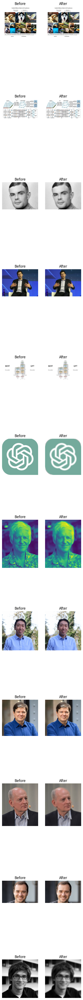

In [7]:
import matplotlib.pyplot as plt
from PIL import ImageFilter

image_paths = []

for infile in glob.glob("images/*"):
    if infile.endswith(".png") or infile.endswith(".jpg") or infile.endswith(".webp"):
        file, ext = os.path.splitext(infile)
        image_paths.append(file+ext)

num_images = len(image_paths)
fig, axes = plt.subplots(num_images, 2, figsize=(5,5 * (num_images + 1)))



for i, img_path in enumerate(image_paths):
    original_image = Image.open(img_path)
    blurred_image = original_image.filter(ImageFilter.BLUR)

    axes[i][0].imshow(original_image)
    axes[i][1].imshow(blurred_image)
    
    axes[i][0].axis('off')
    axes[i][1].axis('off')

    axes[i][0].set_title('Before')
    axes[i][1].set_title('After')

plt.show()

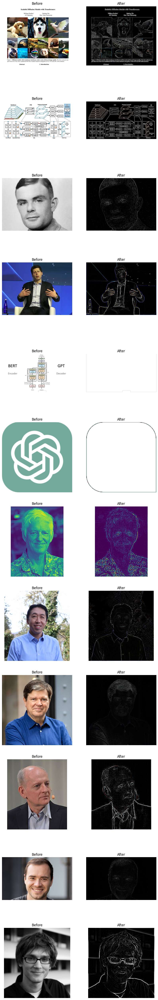

In [8]:
image_paths = []

for infile in glob.glob("images/*"):
    if infile.endswith(".png") or infile.endswith(".jpg") or infile.endswith(".webp"):
        file, ext = os.path.splitext(infile)
        image_paths.append(file+ext)

num_images = len(image_paths)
fig, axes = plt.subplots(num_images, 2, figsize=(10,5 * (num_images + 1)))



for i, img_path in enumerate(image_paths):
    original_image = Image.open(img_path)
    blurred_image = original_image.filter(ImageFilter.FIND_EDGES)

    axes[i][0].imshow(original_image)
    axes[i][1].imshow(blurred_image)
    
    axes[i][0].axis('off')
    axes[i][1].axis('off')

    axes[i][0].set_title('Before')
    axes[i][1].set_title('After')

plt.show()

In [10]:
with open('texts.txt', 'r', encoding='utf-8') as file:
    text = file.read()

propozitii = text.split('.')

numar_propozitii = len(propozitii)

print("Numărul de propoziții din text:", numar_propozitii)


Numărul de propoziții din text: 9


In [4]:
with open('texts.txt', 'r', encoding='utf-8') as file:
    text = file.read()

cuvinte = text.split()

numar_cuvinte = len(cuvinte)

print("Numărul de cuvinte din text:", numar_cuvinte)


Numărul de cuvinte din text: 156


In [5]:
with open('texts.txt', 'r', encoding='utf-8') as file:
    text = file.read()

cuvinte = text.split()

cuvinte_unice = set(cuvinte)

numar_cuvinte_unice = len(cuvinte_unice)

print("Numărul de cuvinte diferite din text:", numar_cuvinte_unice)


Numărul de cuvinte diferite din text: 101


In [6]:
with open('texts.txt', 'r', encoding='utf-8') as file:
    text = file.read()

cuvinte = text.split()

cel_mai_scurt_cuvant = min(cuvinte, key=len)
cel_mai_lung_cuvant = max(cuvinte, key=len)

print("Cel mai scurt cuvânt:", cel_mai_scurt_cuvant)
print("Cel mai lung cuvânt:", cel_mai_lung_cuvant)


Cel mai scurt cuvânt: o
Cel mai lung cuvânt: laboratoarele


In [9]:
from unidecode import unidecode

with open('texts.txt', 'r', encoding='utf-8') as file:
    text = file.read()

text_fara_diacritice = unidecode(text)

print(text_fara_diacritice)


Mesaj de informare: 
Cursul si laboratoarele de Inteligenta Artificiala vor fi o 
provocare pentru toti. Suntem convinsi ca veti realiza proiecte 
foarte interesante. Va incurajam sa adresati intrebari atunci 
cand ceva nu e clar, atat in mod live, cat si folosind platforma 
Teams, canalul "general". 
Daca ati citit pana aici, va rugam sa lasati un mesaj pe canalul 
general cu textul "Am citit textul pentru problema 3". 
Mesaj de informare generat de ChatGPT:
Stimati cursanti,
Suntem incantati sa va avem in echipa noastra pentru Cursul si 
laboratoarele de Inteligenta Artificiala. Aceasta experienta va 
fi o adevarata provocare, dar suntem convinsi ca veti realiza 
proiecte extrem de interesante.
Va incurajam sa fiti activi si sa adresati intrebari atunci cand 
ceva nu este clar. Fie ca este vorba de o discutie in timp real 
sau prin intermediul platformei Teams, canalul "general", suntem 
aici sa va sprijinim.
Succes si sa inceapa aventura AI!
Cu consideratie, Echipa de Inteligenta Ar

In [6]:
import nltk
from nltk.corpus import wordnet

nltk.download('punkt')
nltk.download('wordnet')

with open('texts.txt', 'r', encoding='utf-8') as file:
    text = file.read()

cuvinte = nltk.word_tokenize(text)

cel_mai_lung_cuvant = max(cuvinte, key=len)

sinonime = set()
for synset in wordnet.synsets(cel_mai_lung_cuvant):
    for lemma in synset.lemmas():
        sinonime.add(lemma.name())

print("Sinonimele pentru", cel_mai_lung_cuvant, "sunt:", sinonime)


Sinonimele pentru laboratoarele sunt: set()


[nltk_data] Downloading package punkt to /home/codespace/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /home/codespace/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
